In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.simplefilter("ignore")

from datetime import datetime
from sklearn.preprocessing import MinMaxScaler

plt.rc('font', family='NanumGothic') # For Windows
print(plt.rcParams['font.family'])

['NanumGothic']


In [2]:
#path = '../data/CPC(2~5)/2월/CM7/20230220~20230223_CM7.xlsx'
path = '../data/CPC(2~5)/2월/CM7/20230204~20230206_CM7.xlsx'
all_df = pd.read_excel(path)

In [3]:
all_df.head()

,idx,ae_name,cnt_name,cnt_data,cnt_time
0,8,PLC_CPC_LineB,CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_HE...,572.0,1675436399929
1,9,PLC_CPC_LineB,CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_HE...,602.0,1675436399929
2,10,PLC_CPC_LineB,CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_ALT,296.0,1675436399929
3,11,PLC_CPC_LineB,CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_HE...,543.0,1675436399929
4,12,PLC_CPC_LineB,CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_FCT,6554.0,1675436399929


1. 싸이클타임 : CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_ALT
2. 보온로압력 : CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_FP
3. 챔버압력    : CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_CP
4. 용탕온도    : CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_FT
5. 코일온도    : CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_FCT
6. 코일전류1  : CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_HEATER_L1
7. 코일전류2  : CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_HEATER_L2
8. 코일전류3  : CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_HEATER_L3

In [4]:
set(all_df['cnt_name'])

{'CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_ALT',
 'CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_CP',
 'CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_FCT',
 'CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_FP',
 'CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_FT',
 'CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_HEATER_L1',
 'CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_HEATER_L2',
 'CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_HEATER_L3'}

In [5]:
all_df.info() # NULL 값 X

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 914235 entries, 0 to 914234
Data columns (total 5 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   idx       914235 non-null  int64  
 1   ae_name   914235 non-null  object 
 2   cnt_name  914235 non-null  object 
 3   cnt_data  914235 non-null  float64
 4   cnt_time  914235 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 34.9+ MB


In [6]:
# UNIX 시간 복원
all_df['cnt_time'] = all_df['cnt_time'].apply(lambda x: datetime.utcfromtimestamp(int(x)//1000))

In [7]:
FP_df = all_df[all_df['cnt_name']=='CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_FP']
coil1_df = all_df[all_df['cnt_name']=='CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_HEATER_L1']
coil2_df = all_df[all_df['cnt_name']=='CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_HEATER_L2']
coil3_df = all_df[all_df['cnt_name']=='CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_HEATER_L3']
T_df = all_df[all_df['cnt_name']=='CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_FT']
coilT_df = all_df[all_df['cnt_name']=='CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_FCT']

{'whiskers': [<matplotlib.lines.Line2D at 0x1529558fc40>,
 'caps': [<matplotlib.lines.Line2D at 0x152955521c0>,
 'boxes': [<matplotlib.lines.Line2D at 0x1529558f9a0>],
 'medians': [<matplotlib.lines.Line2D at 0x15295552700>],
 'fliers': [<matplotlib.lines.Line2D at 0x152955529a0>],
 'means': []}

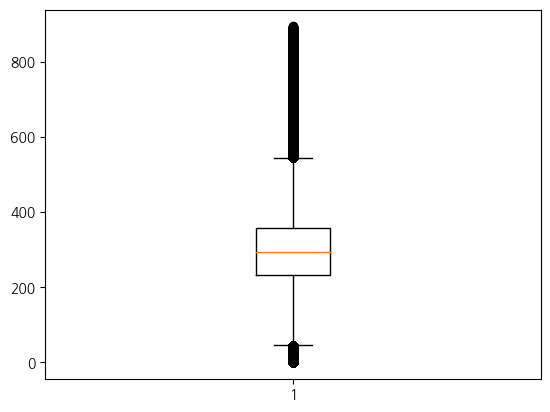

In [8]:
plt.boxplot(coil3_df['cnt_data'])

{'whiskers': [<matplotlib.lines.Line2D at 0x1528d3e3910>,
 'caps': [<matplotlib.lines.Line2D at 0x1528d3e3e50>,
 'boxes': [<matplotlib.lines.Line2D at 0x1528d3e3670>],
 'medians': [<matplotlib.lines.Line2D at 0x1528d3f63d0>],
 'fliers': [<matplotlib.lines.Line2D at 0x1528d3f6670>],
 'means': []}

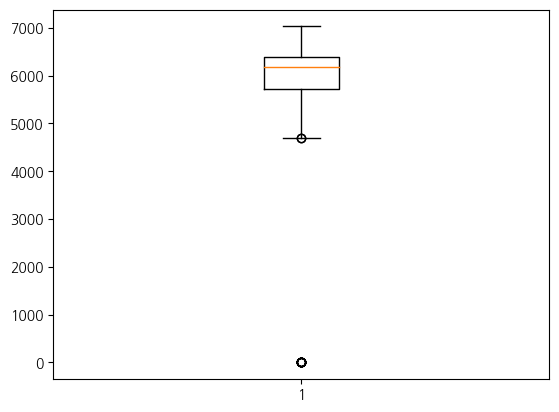

In [9]:
plt.boxplot(coilT_df['cnt_data'])

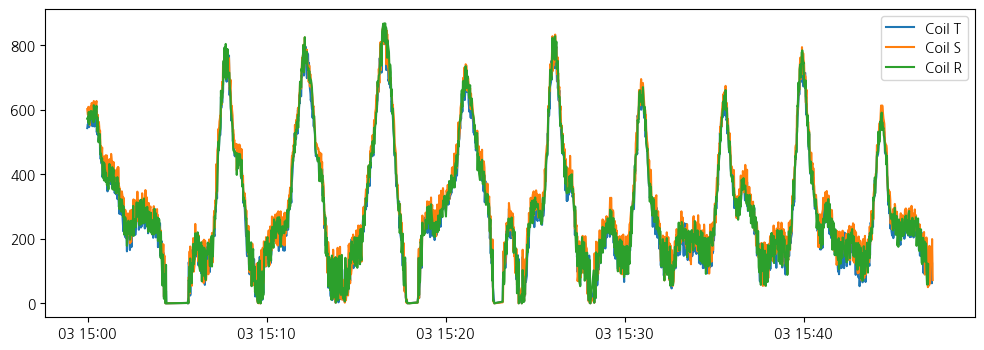

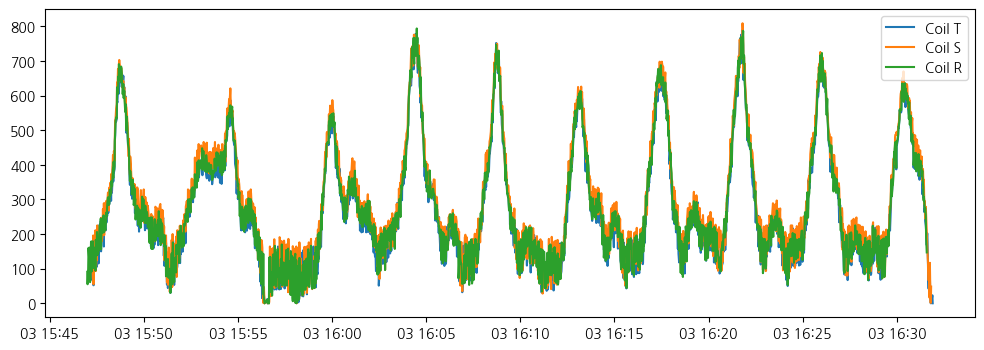

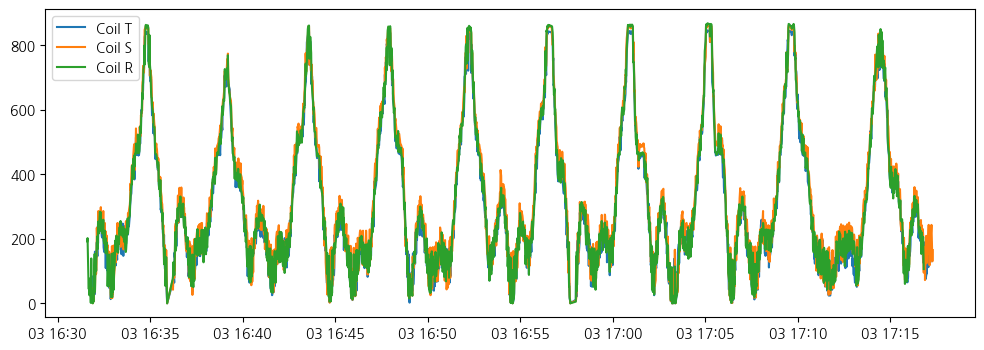

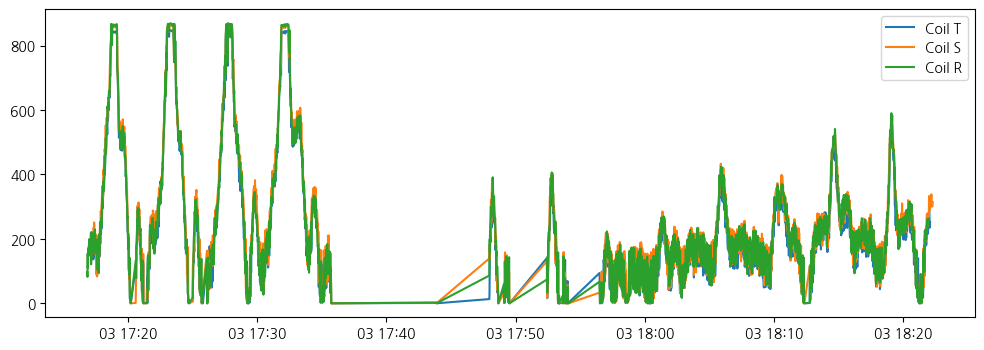

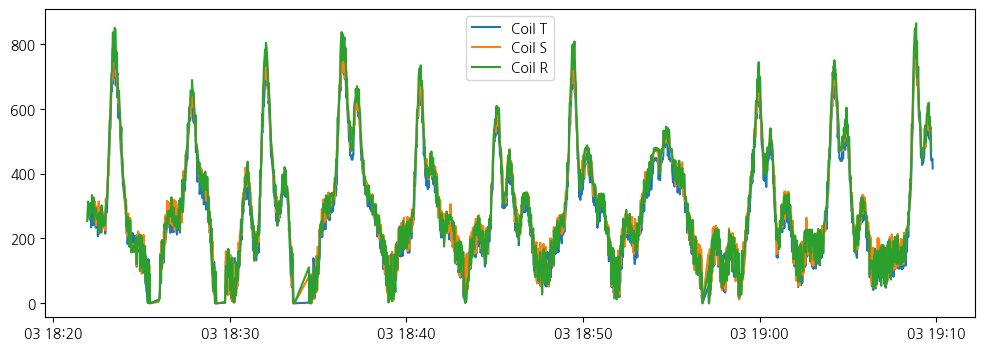

...

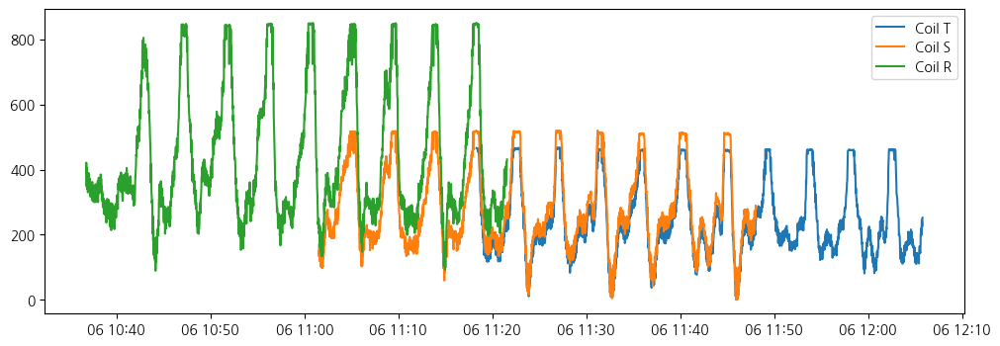

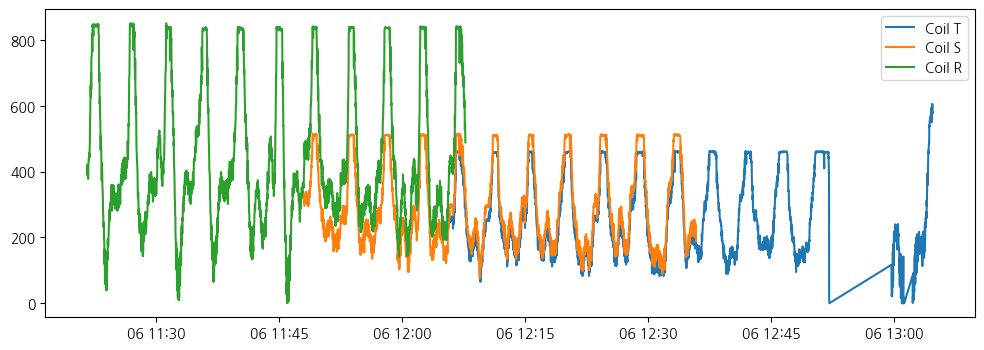

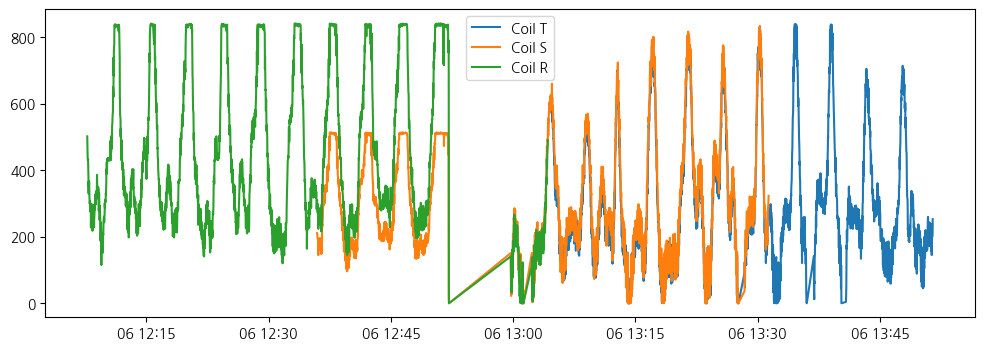

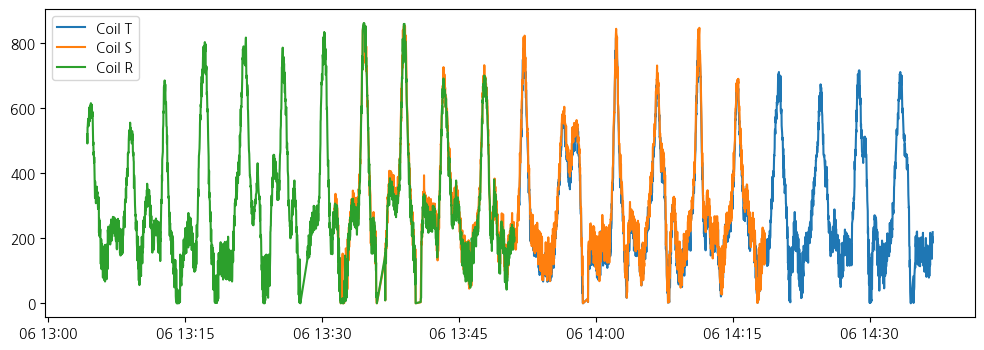

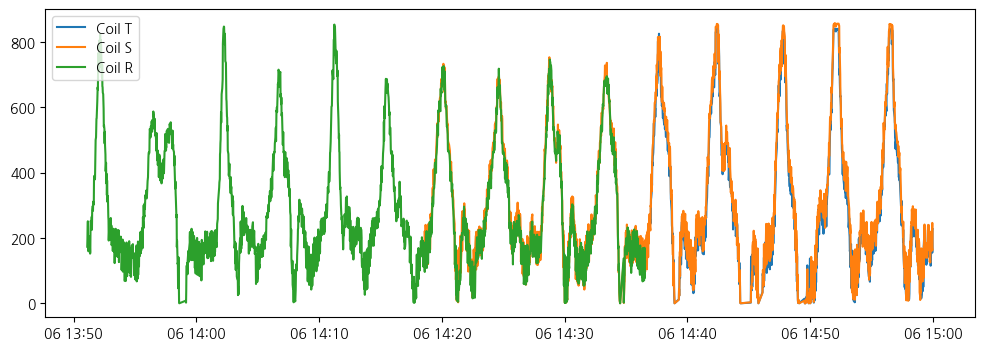

In [19]:
i = 0
size = 2000 # window size


while i*size < len(coil1_df):
    plt.figure(figsize=(12,4))
    plt.plot(coil1_df[i*size:(i+1)*size]['cnt_time'], coil1_df[i*size:(i+1)*size]['cnt_data'], label='Coil T')
    plt.plot(coil2_df[i*size:(i+1)*size]['cnt_time'], coil2_df[i*size:(i+1)*size]['cnt_data'], label='Coil S')
    plt.plot(coil3_df[i*size:(i+1)*size]['cnt_time'], coil3_df[i*size:(i+1)*size]['cnt_data'], label='Coil R')
    #plt.plot(coilT_df[i*size:(i+1)*size]['cnt_time'], coilT_df[i*size:(i+1)*size]['cnt_data'], label='coilT')
    
    plt.legend()
    plt.show()
    
    i+=1 
    #if i == 10:
     #   break

In [11]:
scaler = MinMaxScaler()

In [29]:
normalized_FP = FP_df.copy() # 보온로 압력

normalized_T = T_df.copy() # 용탕 온도
normalized_CoilT = coilT_df.copy() # 용탕 온도
normalized_Coil = coil1_df.copy() # 코일


numerical = ['cnt_data']
normalized_FP[numerical] = scaler.fit_transform(normalized_FP[numerical])
normalized_Coil[numerical] = scaler.fit_transform(normalized_Coil[numerical])
normalized_T[numerical] = scaler.fit_transform(normalized_T[numerical])
normalized_CoilT[numerical] = scaler.fit_transform(normalized_CoilT[numerical])


df_list = [normalized_FP, normalized_Coil, normalized_T, normalized_CoilT]
df_dict = {#'보온로 압력':('blue', normalized_FP), 
           #'코일 전류': ('gold', normalized_Coil),
           '용탕 온도':('red', normalized_T),
           '코일 온도':('green', normalized_CoilT)}

In [30]:
normalized_FP

,idx,ae_name,cnt_name,cnt_data,cnt_time
289,6828,PLC_CPC_LineB,CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_FP,0.001834,2023-02-03 15:01:17
295,6954,PLC_CPC_LineB,CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_FP,0.002293,2023-02-03 15:01:18
301,7065,PLC_CPC_LineB,CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_FP,0.001834,2023-02-03 15:01:19
312,7335,PLC_CPC_LineB,CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_FP,0.002293,2023-02-03 15:01:22
322,7549,PLC_CPC_LineB,CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_FP,0.001834,2023-02-03 15:01:24
...,...,...,...,...,...
914062,361635,PLC_CPC_LineB,CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_FP,0.016965,2023-02-06 14:59:15
914068,362056,PLC_CPC_LineB,CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_FP,0.003668,2023-02-06 14:59:18
914084,362253,PLC_CPC_LineB,CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_FP,0.003210,2023-02-06 14:59:21
914143,363516,PLC_CPC_LineB,CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_FP,0.002751,2023-02-06 14:59:35


<Figure size 1200x400 with 0 Axes>

<Figure size 1200x400 with 0 Axes>

<Figure size 1200x400 with 0 Axes>

<Figure size 1200x400 with 0 Axes>

<Figure size 1200x400 with 0 Axes>

<Figure size 1200x400 with 0 Axes>

<Figure size 1200x400 with 0 Axes>

<Figure size 1200x400 with 0 Axes>

<Figure size 1200x400 with 0 Axes>

<Figure size 1200x400 with 0 Axes>

<Figure size 1200x400 with 0 Axes>

<Figure size 1200x400 with 0 Axes>

<Figure size 1200x400 with 0 Axes>

<Figure size 1200x400 with 0 Axes>

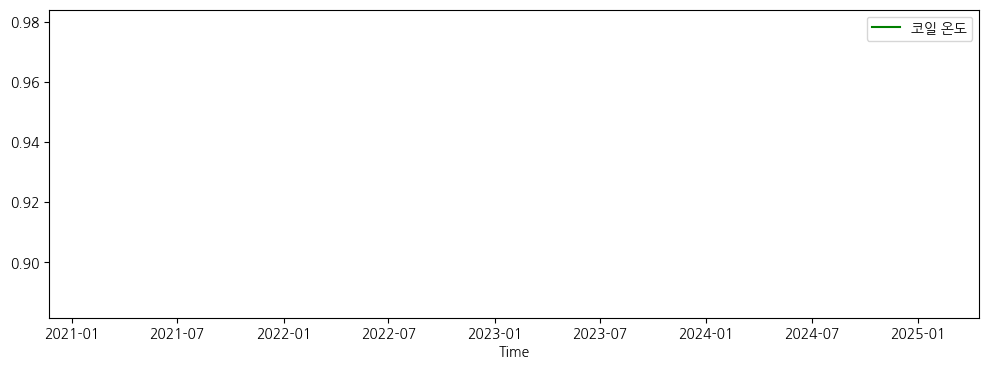

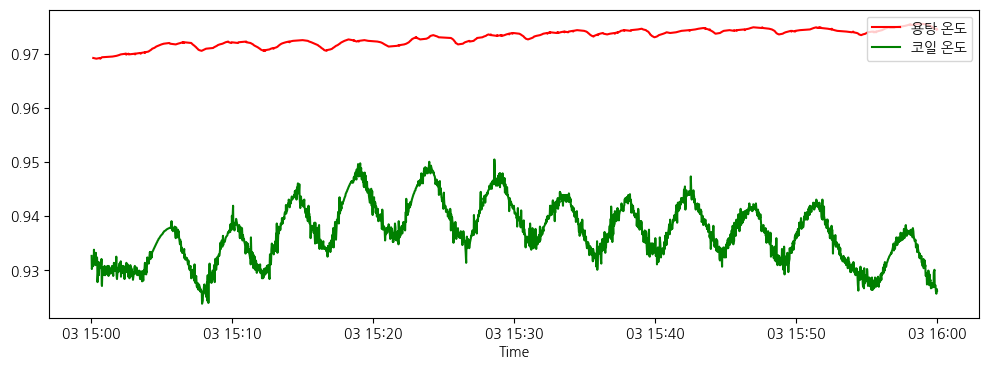

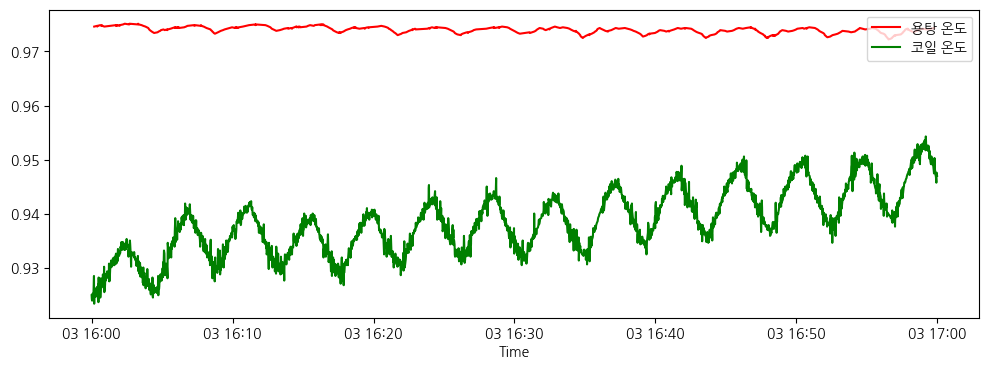

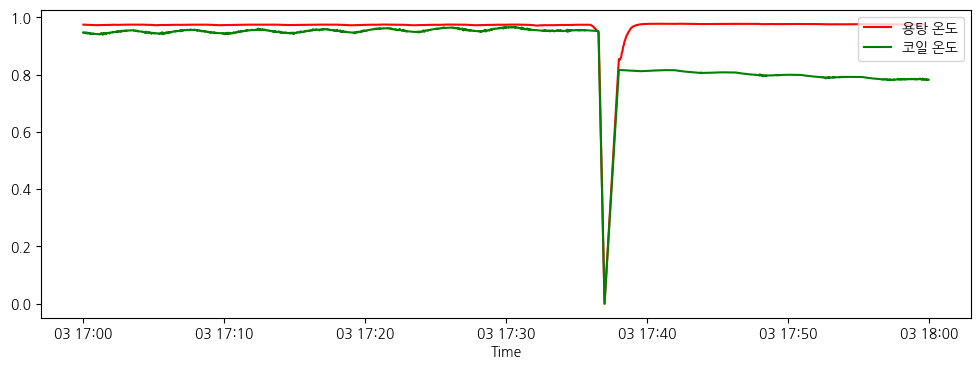

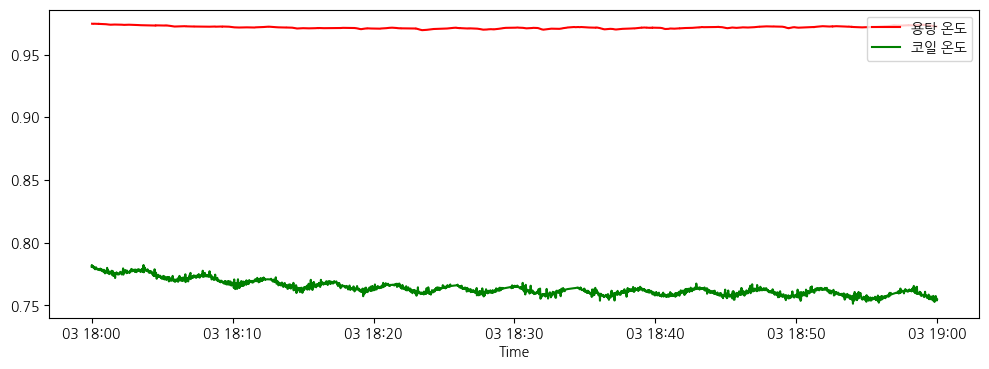

...

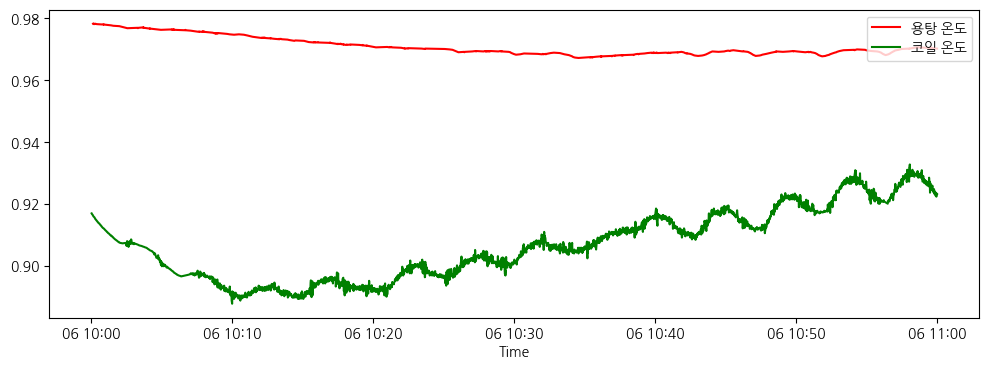

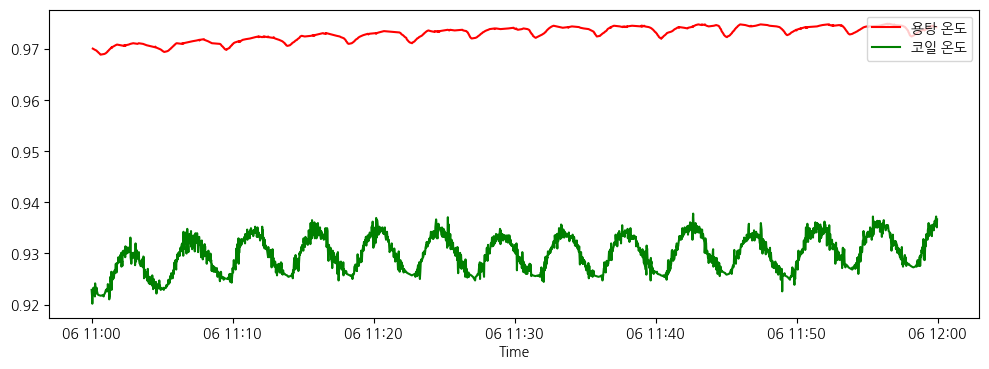

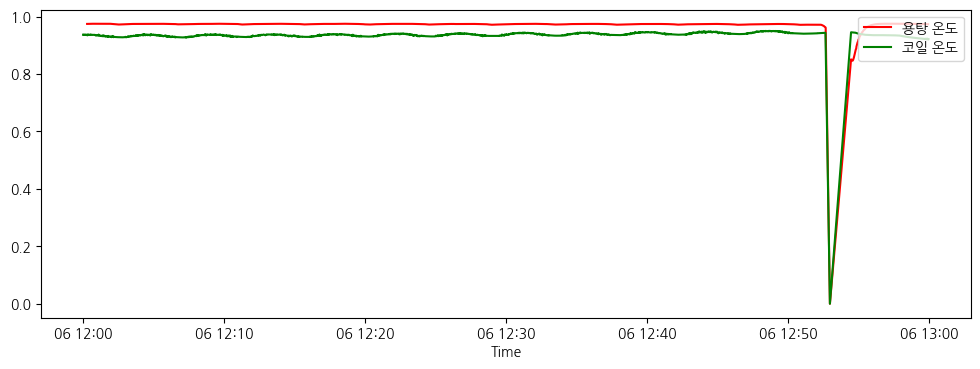

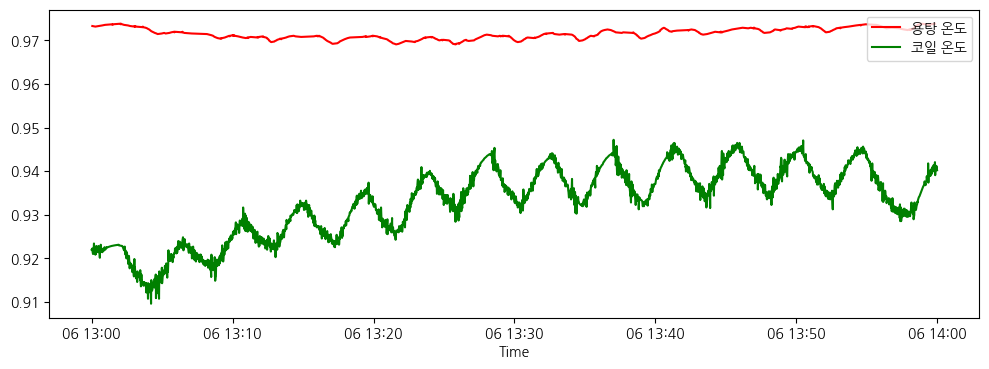

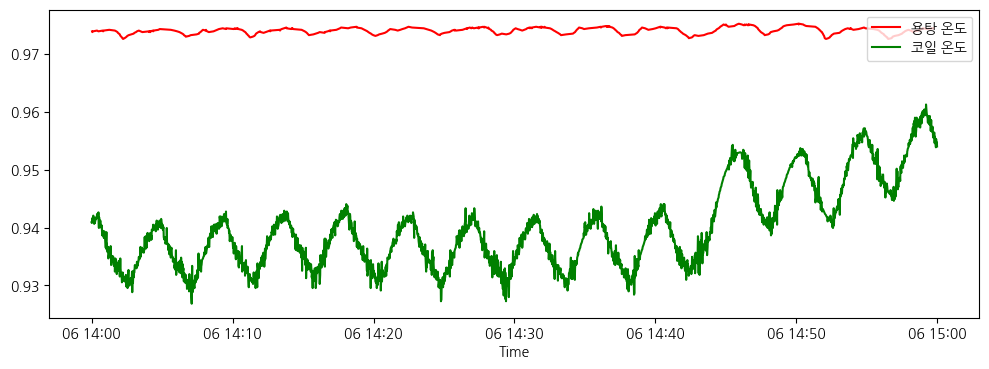

<Figure size 1200x400 with 0 Axes>

<Figure size 1200x400 with 0 Axes>

<Figure size 1200x400 with 0 Axes>

<Figure size 1200x400 with 0 Axes>

<Figure size 1200x400 with 0 Axes>

<Figure size 1200x400 with 0 Axes>

<Figure size 1200x400 with 0 Axes>

<Figure size 1200x400 with 0 Axes>

<Figure size 1200x400 with 0 Axes>

In [33]:
dates = FP_df['cnt_time'].dt.date.unique()

# 일별로 + n시간씩 쪼개서 plot
for date in dates:
    time_step = 1 # 몇 시간씩?
    
    for hour in range(0, 24, time_step):
        #start = pd.Timestamp(f'{date} {hour:02d}:00:00')
        #end = pd. Timestamp(f'{date} {hour+4:02d}:00:00')
        
        plt.figure(figsize=(12,4))
        for k, (color, df) in df_dict.items():
            df_by_date = df[df['cnt_time'].dt.date == date]
            #df_by_4h = df_by_date[(df_by_date['cnt_time'] >= start) & (df_by_date['cnt_time'] <= end)]
            df_by_nh = df_by_date[(df_by_date['cnt_time'].dt.hour >= hour) & (df_by_date['cnt_time'].dt.hour < hour + time_step)]
            
            
            if not df_by_nh.empty:
                plt.plot(df_by_nh['cnt_time'], df_by_nh['cnt_data'], label=k,color=color)
                plt.xlabel('Time')
                #plt.ylim(0.9,1)
                plt.legend(loc='upper right')
        plt.show()